In [1]:
import os
os.environ["MUJOCO_GL"] = "egl"
import numpy as np
import torchrl
import importlib
import custom_torchrl_env
import mujoco
import moviepy.editor
import matplotlib.pyplot as plt
import tqdm

In [56]:
import importlib

In [57]:
importlib.reload(custom_torchrl_env)

<module 'custom_torchrl_env' from '/home/emil/Development/custom_torchrl_env/custom_torchrl_env.py'>

In [2]:
env = custom_torchrl_env.RodentRunEnv(batch_size=(16,))
torchrl.envs.utils.check_env_specs(env)
transEnv = torchrl.envs.TransformedEnv(
    env,
    torchrl.envs.Compose(
        # normalize observations
        #torchrl.envs.ObservationNorm(in_keys=["observation"]),
        torchrl.envs.StepCounter(max_steps=5000),
        torchrl.envs.RewardSum()
    ),
)
#transEnv.transform[0].init_stats(num_iter=48, cat_dim=0, reduce_dim=tuple(range(len(env.batch_size)+1)))

2024-04-08 17:40:59,479 [torchrl][INFO] check_env_specs succeeded!


In [3]:
env = custom_torchrl_env.RodentRunEnv(batch_size=(16,))

In [4]:
rollout = transEnv.rollout(5000, break_when_any_done=False)

In [16]:
model = env._mj_model
camera = "side"
scene_option = mujoco.MjvOption()
scene_option.flags[mujoco.mjtVisFlag.mjVIS_JOINT] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_SKIN] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_FLEXSKIN] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_TEXTURE] = True
data = mujoco.MjData(model)
mujoco.mj_resetData(model, data)
model.vis.global_.offheight = 240*2
model.vis.global_.offwidth = 320*2
env_id = 0
T = rollout.shape[1]
all_imgs = np.full((T, 240*2, 320*2, 3), 128, np.uint8)
with mujoco.Renderer(model, 240*2, 320*2) as rend:
    for t in range(T):
        state = rollout["observation"][env_id, t].numpy().astype(np.float64)
        mujoco.mj_setState(model, data, state, mujoco.mjtState.mjSTATE_FULLPHYSICS)
        mujoco.mj_forward(model, data)
        rend.update_scene(data, camera=camera, scene_option=scene_option)
        rend.scene.flags[mujoco.mjtRndFlag.mjRND_FOG] = True
        rend.scene.flags[mujoco.mjtRndFlag.mjRND_SHADOW] = True
        rend.scene.flags[mujoco.mjtRndFlag.mjRND_REFLECTION] = True
        rend.render(out=all_imgs[t])

In [17]:
clip = moviepy.editor.ImageSequenceClip(list(all_imgs), durations=np.full(T, 1/60))

In [18]:
clip.ipython_display(maxduration=120.0, fps=60)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


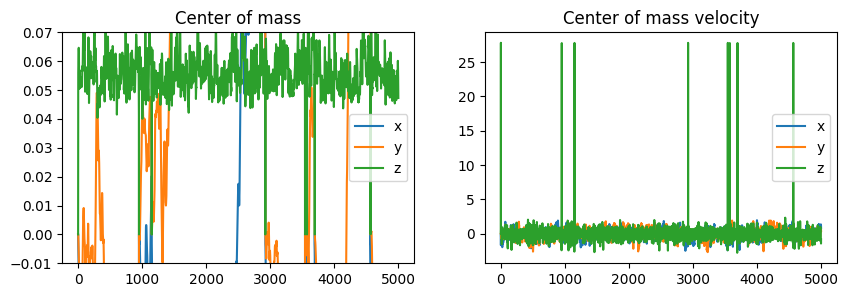

In [5]:
com = rollout[("info", "center_of_mass")][0]
vel = rollout[("info", "velocity")][0]
plt.figure(figsize=(10, 3))
plt.subplot(1,2,1)
plt.plot(com, label=list("xyz"))
plt.title("Center of mass")
plt.ylim(-0.01, 0.07)
plt.legend()
plt.subplot(1,2,2)
plt.plot(vel, label=list("xyz"))
plt.title("Center of mass velocity")
plt.legend()
plt.show()

In [19]:
import torch

In [49]:
avg_dist_from_origin = torch.sqrt(torch.square(rollout[("info", "center_of_mass")][:, :, :2]).sum(axis=-1)).max(axis=-1).values.mean().item()
avg_top_velocity_x = rollout[("info", "velocity")][:, :, 0].max(axis=-1).values.mean().item()
avg_top_velocity_y = rollout[("info", "velocity")][:, :, 1].max(axis=-1).values.mean().item()

In [46]:
avg_dist_from_origin

0.8204129934310913

In [47]:
avg_top_velocity

2.1527888774871826

In [11]:
rollout[("next", "done")].to(dtype=float).mean()

tensor(0.0018, dtype=torch.float64)

In [13]:
rollout["step_count"]

tensor([[[   0],
         [   1],
         [   2],
         ...,
         [ 433],
         [ 434],
         [ 435]],

        [[   0],
         [   1],
         [   2],
         ...,
         [ 224],
         [ 225],
         [ 226]],

        [[   0],
         [   1],
         [   2],
         ...,
         [  86],
         [  87],
         [  88]],

        ...,

        [[   0],
         [   1],
         [   2],
         ...,
         [ 470],
         [ 471],
         [ 472]],

        [[   0],
         [   1],
         [   2],
         ...,
         [1171],
         [1172],
         [1173]],

        [[   0],
         [   1],
         [   2],
         ...,
         [ 445],
         [ 446],
         [ 447]]])

In [19]:
16*1024

16384

In [20]:
np.log2(10_000_000)

23.253496664211536

In [22]:
2**26

67108864

In [23]:
1024**2

1048576